# Predicting Reddit Post Popularity
By: Parth Solanki

In [5]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.decomposition import PCA
import plotly.express as px
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/parth/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

## Preprocessing Data

First we will get the data we need in order to do this research project. Due to the limitations of my machine, I cannot work with all of the data. Hence, I will be going though the csv file in chunks and taking a random sample of data in order to preserve randomness and not introduce bias.

In [6]:
chunksize = 10 ** 5
comments = pd.DataFrame()

with pd.read_csv("text_comments.csv", chunksize=chunksize, lineterminator='\n') as reader:
    for chunk in reader:
        df = chunk.sample(n=250)
        
        if(comments.empty):
            comments = df.copy()
        else:
            comments = comments.append(df.copy())
            
        del df

In [7]:
chunksize = 10 ** 5
posts = pd.DataFrame()
total = 0

with pd.read_csv("text_submissions.csv", chunksize=chunksize, lineterminator='\n') as reader:
    for chunk in reader:
        df = chunk.sample(n=3100)
        
        if(posts.empty):
            posts = df.copy()
        else:
            posts = posts.append(df.copy())
            
        del df

In [8]:
print(comments.shape)
comments.head()

(102000, 7)


,id,score,link_id,author,subreddit,body,created_utc
19493,t1_fy38iw3,0,t3_hr7dga,kiz5,MLBTheShow,There’s an algorithm that dictates counts base...,1594769027
79237,t1_gelomz4,3,t3_k69jap,AmericanHerstoryX,anime,>That's definitely been a thing for human hist...,1607095084
8886,t1_gprt0so,12,t3_ly6jxs,zensunni82,Cosmere,[Cosmere] >!Sick burn!<,1614952108
89761,t1_fpvmn1y,9,t3_gfnyuc,Noriakikukyoin,anime,"Ah yuri, such a beautiful fragrant smell.",1588947810
61227,t1_fs3kv6z,2,t3_groqts,ChalkAndIce,TrueOffMyChest,Your friends sadly aren't your friends. Thankf...,1590680733


In [9]:
print(posts.shape)
posts.head()

(108500, 9)


,id,author,created_utc,domain,is_self,score,selftext,title,subreddit
29415,t3_ob7by8,[deleted],1625089436,self.offmychest,True,1,[deleted],My daughter(5) is being recommended for a coch...,offmychest
25074,t3_h9vybe,Smasborgen,1592279251,theurbandeveloper.com,False,1,NaN,Consortium Digs Deep as Melbourne Metro Moves ...,australia
89919,t3_nyjezq,Raspiy,1623540048,i.redd.it,False,5,NaN,Upvote me now,FreeKarma4U
51137,t3_if4ed0,[deleted],1598193968,i.redd.it,False,2,[deleted],huge pp,PewdiepieSubmissions
70837,t3_jvqytb,[deleted],1605609978,self.teenagersnew,True,3,[deleted],do you ever love someone so much you cant expr...,teenagersnew


There are lots of posts that have been redacted as either \[removed\] or \[deleted\]. We need to remove these as they are not really words 

In [10]:
comments = comments[comments["body"] != "[removed]"]
comments = comments[comments["body"] != "[deleted]"]
comments = comments[~pd.isna(comments["body"])]
comments.shape

(93852, 7)

In [11]:
posts = posts[posts["title"] != "[removed]"]
posts = posts[posts["title"] != "[deleted]"]
posts = posts[~pd.isna(posts["title"])]
posts.shape

(108498, 9)

I hypothesized that the time in which you post or comment plays a large role in the number of engagements. In order to test this hpothesis, I will add the day of the week it was posted, the hour, and the day of the year.

In [12]:
comments["date"] = pd.to_datetime(comments['created_utc'], unit='s')
comments["dow"] = comments["date"].dt.dayofweek
comments["day"] = comments["date"].dt.dayofyear
comments["hour"] = comments["date"].dt.hour
comments = comments.drop("date", axis=1)
comments = comments.drop("created_utc", axis=1)
comments.head()

,id,score,link_id,author,subreddit,body,dow,day,hour
19493,t1_fy38iw3,0,t3_hr7dga,kiz5,MLBTheShow,There’s an algorithm that dictates counts base...,1,196,23
79237,t1_gelomz4,3,t3_k69jap,AmericanHerstoryX,anime,>That's definitely been a thing for human hist...,4,339,15
8886,t1_gprt0so,12,t3_ly6jxs,zensunni82,Cosmere,[Cosmere] >!Sick burn!<,4,64,13
89761,t1_fpvmn1y,9,t3_gfnyuc,Noriakikukyoin,anime,"Ah yuri, such a beautiful fragrant smell.",4,129,14
61227,t1_fs3kv6z,2,t3_groqts,ChalkAndIce,TrueOffMyChest,Your friends sadly aren't your friends. Thankf...,3,149,15


In [13]:
posts["date"] = pd.to_datetime(posts['created_utc'], unit='s')
posts["dow"] = posts["date"].dt.dayofweek
posts["day"] = posts["date"].dt.dayofyear
posts["hour"] = posts["date"].dt.hour
posts = posts.drop("date", axis=1)
posts = posts.drop("created_utc", axis=1)
posts.head()

,id,author,domain,is_self,score,selftext,title,subreddit,dow,day,hour
29415,t3_ob7by8,[deleted],self.offmychest,True,1,[deleted],My daughter(5) is being recommended for a coch...,offmychest,2,181,21
25074,t3_h9vybe,Smasborgen,theurbandeveloper.com,False,1,NaN,Consortium Digs Deep as Melbourne Metro Moves ...,australia,1,168,3
89919,t3_nyjezq,Raspiy,i.redd.it,False,5,NaN,Upvote me now,FreeKarma4U,5,163,23
51137,t3_if4ed0,[deleted],i.redd.it,False,2,[deleted],huge pp,PewdiepieSubmissions,6,236,14
70837,t3_jvqytb,[deleted],self.teenagersnew,True,3,[deleted],do you ever love someone so much you cant expr...,teenagersnew,1,322,10


There are lots of posts that have been redacted as either \[removed\] or \[deleted\]. We need to remove these as they are not really words 

In [14]:
posts.loc[(posts["selftext"] != "[removed]") & (posts["selftext"] != "[deleted]") & ~(pd.isna(posts["selftext"])), "title"] = posts.loc[(posts["selftext"] != "[removed]") & (posts["selftext"] != "[deleted]") & ~(pd.isna(posts["selftext"])), "title"] + " " + posts.loc[(posts["selftext"] != "[removed]") & (posts["selftext"] != "[deleted]") & ~(pd.isna(posts["selftext"])), "selftext"]                                                                                                              
posts = posts.drop("selftext", axis=1)
posts = posts.drop("domain", axis=1) 
posts = posts.drop("author", axis=1)
posts.head()
                                                                                                                  

,id,is_self,score,title,subreddit,dow,day,hour
29415,t3_ob7by8,True,1,My daughter(5) is being recommended for a coch...,offmychest,2,181,21
25074,t3_h9vybe,False,1,Consortium Digs Deep as Melbourne Metro Moves ...,australia,1,168,3
89919,t3_nyjezq,False,5,Upvote me now,FreeKarma4U,5,163,23
51137,t3_if4ed0,False,2,huge pp,PewdiepieSubmissions,6,236,14
70837,t3_jvqytb,True,3,do you ever love someone so much you cant expr...,teenagersnew,1,322,10


In [15]:
posts = posts.set_index("id")
posts["is_self"] = posts["is_self"].astype(int)
posts.head()

,is_self,score,title,subreddit,dow,day,hour
id,,,,,,,
t3_ob7by8,1,1,My daughter(5) is being recommended for a coch...,offmychest,2,181,21
t3_h9vybe,0,1,Consortium Digs Deep as Melbourne Metro Moves ...,australia,1,168,3
t3_nyjezq,0,5,Upvote me now,FreeKarma4U,5,163,23
t3_if4ed0,0,2,huge pp,PewdiepieSubmissions,6,236,14
t3_jvqytb,1,3,do you ever love someone so much you cant expr...,teenagersnew,1,322,10


It is unlikely that the username of an poster ot the id of their link determines it's engagments. I hypothesize that it is moreso the title and body that catch people's attention, hence why I removed the unnecessary columns.

In [16]:
comments = comments.drop("author", axis=1)
comments = comments.drop("link_id", axis=1) 
comments = comments.set_index("id")
comments.head()

,score,subreddit,body,dow,day,hour
id,,,,,,
t1_fy38iw3,0,MLBTheShow,There’s an algorithm that dictates counts base...,1,196,23
t1_gelomz4,3,anime,>That's definitely been a thing for human hist...,4,339,15
t1_gprt0so,12,Cosmere,[Cosmere] >!Sick burn!<,4,64,13
t1_fpvmn1y,9,anime,"Ah yuri, such a beautiful fragrant smell.",4,129,14
t1_fs3kv6z,2,TrueOffMyChest,Your friends sadly aren't your friends. Thankf...,3,149,15



We will later normalize the scores of each comment and post by the subreddit, therefore, I am removing posts and comments of subreddits for which we just do not have enough information. I defined not enough information as having less than 50 posts or comments from that subreddit 


In [17]:
counts = posts.groupby("subreddit").count()
notEnoughInfo = counts[counts["is_self"] < 50].index

posts = posts[~(posts["subreddit"].isin(notEnoughInfo))]
posts.shape

(57008, 7)

In [18]:
counts = comments.groupby("subreddit").count()
notEnoughInfo = counts[counts["body"] < 50].index

comments = comments[~(comments["subreddit"].isin(notEnoughInfo))]
comments.shape

(51479, 6)

Subreddits vary quite heavily by populariy. Often, popular subreddits get a lot of traction and engagements while others may not. Hence, by keeping the raw score we would be ignoring if in fact that post or comment is popular relative to that subreddit. Therefore, we will be using the percentile of the score relative to the all scores in our dataset for that subreddit

In [19]:
posts["percentile"] = posts.groupby("subreddit")["score"].rank(pct=True)
posts.head()

,is_self,score,title,subreddit,dow,day,hour,percentile
id,,,,,,,,
t3_ob7by8,1,1,My daughter(5) is being recommended for a coch...,offmychest,2,181,21,0.286070
t3_nyjezq,0,5,Upvote me now,FreeKarma4U,5,163,23,0.788810
t3_if4ed0,0,2,huge pp,PewdiepieSubmissions,6,236,14,0.271429
t3_jvqytb,1,3,do you ever love someone so much you cant expr...,teenagersnew,1,322,10,0.656250
t3_ntv7qi,0,3,Pewds is pretty smart tho,PewdiepieSubmissions,6,157,20,0.312782


In [20]:
comments["percentile"] = comments.groupby("subreddit")["score"].rank(pct=True)
comments.head()

,score,subreddit,body,dow,day,hour,percentile
id,,,,,,,
t1_gelomz4,3,anime,>That's definitely been a thing for human hist...,4,339,15,0.552381
t1_fpvmn1y,9,anime,"Ah yuri, such a beautiful fragrant smell.",4,129,14,0.826190
t1_fs3kv6z,2,TrueOffMyChest,Your friends sadly aren't your friends. Thankf...,3,149,15,0.702899
t1_g1fky0v,1,TrueOffMyChest,You've projected so many things onto me. When ...,4,227,11,0.340580
t1_gfjeazq,1,TrueOffMyChest,Ok Transphobe,5,347,15,0.340580


It is reasonable to assume that the tone of the reddit post or comment matter when it comes to whether or not someone choose to upvote or downvote it. As a result, I will be incorporating sentimental analysis to get the tone of that post or comment

In [21]:
sia = SentimentIntensityAnalyzer()

In [22]:
title_sentiment = posts["title"].apply(lambda x: pd.Series(sia.polarity_scores(x)))
posts = pd.concat([posts, title_sentiment], axis=1).drop("compound", axis=1)
posts.head()

,is_self,score,title,subreddit,dow,day,hour,percentile,neg,neu,pos
id,,,,,,,,,,,
t3_ob7by8,1,1,My daughter(5) is being recommended for a coch...,offmychest,2,181,21,0.286070,0.0,0.795,0.205
t3_nyjezq,0,5,Upvote me now,FreeKarma4U,5,163,23,0.788810,0.0,1.000,0.000
t3_if4ed0,0,2,huge pp,PewdiepieSubmissions,6,236,14,0.271429,0.0,0.303,0.697
t3_jvqytb,1,3,do you ever love someone so much you cant expr...,teenagersnew,1,322,10,0.656250,0.0,0.704,0.296
t3_ntv7qi,0,3,Pewds is pretty smart tho,PewdiepieSubmissions,6,157,20,0.312782,0.0,0.337,0.663


In [23]:
comments_sentiment = comments["body"].apply(lambda x: pd.Series(sia.polarity_scores(x)))
comments = pd.concat([comments, comments_sentiment], axis=1).drop("compound", axis=1)
comments.head()

,score,subreddit,body,dow,day,hour,percentile,neg,neu,pos
id,,,,,,,,,,
t1_gelomz4,3,anime,>That's definitely been a thing for human hist...,4,339,15,0.552381,0.036,0.886,0.079
t1_fpvmn1y,9,anime,"Ah yuri, such a beautiful fragrant smell.",4,129,14,0.826190,0.000,0.562,0.438
t1_fs3kv6z,2,TrueOffMyChest,Your friends sadly aren't your friends. Thankf...,3,149,15,0.702899,0.198,0.554,0.248
t1_g1fky0v,1,TrueOffMyChest,You've projected so many things onto me. When ...,4,227,11,0.340580,0.203,0.689,0.108
t1_gfjeazq,1,TrueOffMyChest,Ok Transphobe,5,347,15,0.340580,0.000,0.312,0.688


# Visualizations

Before continuing with processing the data, I'd like to view a few properties of the top 10 posts and comments from each subreddit

In [24]:
top10Posts = posts.sort_values(["subreddit", "score"], ascending=False).groupby("subreddit").head(10)

In [25]:
top10Comments = comments.sort_values(["subreddit", "score"], ascending=False).groupby("subreddit").head(10)

Firstly, I wanted to see the effect of tone on the top comments and posts, and as seen below, we see that overwhelmingly most of the posts and comments are simply neutral.

In [75]:
print(top10Posts["pos"].mean())

0.11451042780748663


In [76]:
print(top10Posts["neg"].mean())

0.07247005347593583


In [77]:
print(top10Posts["neu"].mean())

0.8114122994652406


Now, we'll see how the day of the week and hour of day in which the post or comment is uploaded affects the top posts on each subreddit

Text(0, 0.5, 'count')

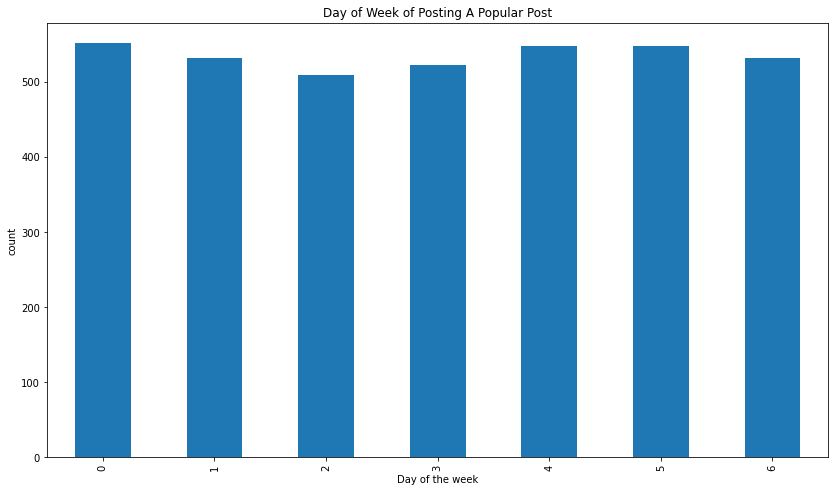

In [26]:
ax = top10Posts["dow"].value_counts().sort_index().plot(kind="bar", figsize=(14, 8), title="Day of Week of Posting A Popular Post")
ax.set_xlabel("Day of the week")
ax.set_ylabel("count")

Text(0, 0.5, 'count')

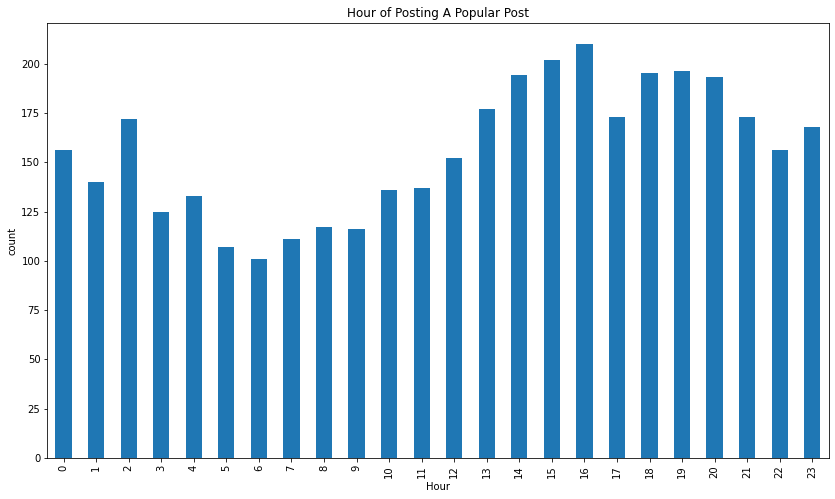

In [27]:
ax = top10Posts["hour"].value_counts().sort_index().plot(kind="bar", figsize=(14, 8), title="Hour of Posting A Popular Post")
ax.set_xlabel("Hour")
ax.set_ylabel("count")

Text(0, 0.5, 'count')

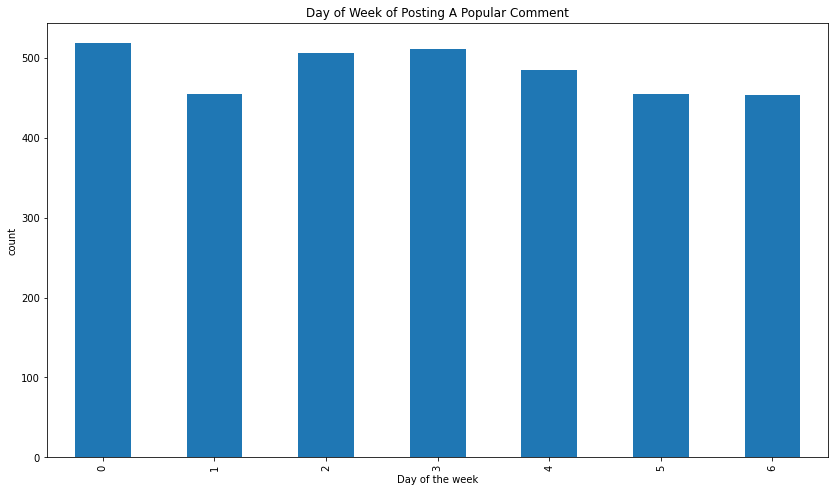

In [28]:
ax = top10Comments["dow"].value_counts().sort_index().plot(kind="bar", figsize=(14, 8), title="Day of Week of Posting A Popular Comment")
ax.set_xlabel("Day of the week")
ax.set_ylabel("count")

Text(0, 0.5, 'count')

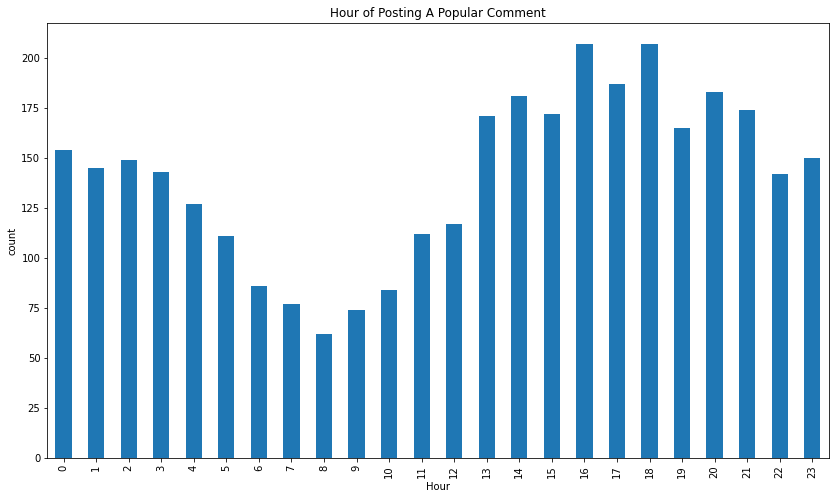

In [29]:
ax = top10Comments["hour"].value_counts().sort_index().plot(kind="bar", figsize=(14, 8), title="Hour of Posting A Popular Comment")
ax.set_xlabel("Hour")
ax.set_ylabel("count")

We will now continue to process the data in order to get it ready for modelling. We will use the bag or words technique with the countvectorizer to get the word counts and then take the top 2000 words. It is fair to assume that there is some sort of pattern with the words you choose that may affect the enagagments. But alongside that, I feel it is important to also add metadata of each post and coment which includes the date at which it was posted, and the the sentimental analysis.

In [30]:
cv = CountVectorizer(lowercase=True, stop_words="english", ngram_range=(1,2), max_features=2000)
X = cv.fit_transform(posts["title"]).toarray()
data = pd.DataFrame(data=X, columns=cv.get_feature_names_out())

In [31]:
data.set_index(posts.index, inplace=True)

In [32]:
data["dow"] = posts["dow"]

In [33]:
data["hour"] = posts["hour"]
data.head()

,00,000,01,03,10,100,1000,11,12,13,...,yes,yesterday,young,younger,youtu,youtube,youtube com,zero,zone,dow
id,,,,,,,,,,,,,,,,,,,,,
t3_ob7by8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
t3_nyjezq,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
t3_if4ed0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6
t3_jvqytb,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
t3_ntv7qi,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,6


In [34]:
X = cv.fit_transform(comments["body"]).toarray()
dataComments = pd.DataFrame(data=X, columns=cv.get_feature_names_out())

In [35]:
dataComments.set_index(comments.index, inplace=True)

In [36]:
dataComments["dow"] = comments["dow"]

In [37]:
dataComments["hour"] = comments["hour"]
dataComments.head()

,000,0a,0d,10,10 years,100,11,12,13,14,...,yo,young,younger,youtu,youtube,youtube com,yta,yup,zero,dow
id,,,,,,,,,,,,,,,,,,,,,
t1_gelomz4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
t1_fpvmn1y,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
t1_fs3kv6z,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3
t1_g1fky0v,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
t1_gfjeazq,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5


In [38]:
total = data.sum()
data = data[total.sort_values(ascending=False).index]

In [39]:
total = dataComments.sum()
dataComments[total.sort_values(ascending=False).index]

,hour,dow,just,like,people,https,don,com,reddit,think,...,army,tl,removed protect,silver,innocent,progress,masks,ll welcome,minority,scryfall
id,,,,,,,,,,,,,,,,,,,,,
t1_gelomz4,15,4,4,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
t1_fpvmn1y,14,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
t1_fs3kv6z,15,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
t1_g1fky0v,11,4,1,0,0,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
t1_gfjeazq,15,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
t1_elcixvy,13,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
t1_fc7xiqj,8,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
t1_elwj423,10,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Classification

Now we will begin to attempt to create a classification model that predicts whether or not the post or comment will become popular. In this case, we assume a post or comment in popular if it is above the 50th percentile. Which means it is more popular than half the posts (in our representative sample)

In [88]:
posts.loc[posts["percentile"] > 0.50, "label"] = 1
posts.loc[posts["percentile"] <= 0.50, "label"] = 0

In [41]:
y_posts = posts["label"].copy()
X_posts = data.copy()

In [42]:
comments.loc[comments["percentile"] > 0.50, "label"] = 1
comments.loc[comments["percentile"] <= 0.50, "label"] = 0

In [43]:
y_comments = comments["label"].copy()
X_comments = dataComments.copy()

### Posts

We will begin by modelling the data regarding posts.

Let us first visualize the posts in an interactive plot to see whether or not any sort of pattern exists that may be modelled using classification. The blue points represents posts that are not popular, while the yellow ones are.

In [44]:
pca = PCA(n_components=200)
postsTransformed = pca.fit_transform(X_posts)
PCAposts = pd.DataFrame(postsTransformed, index=X_posts.index)

In [45]:
PCAposts["label"] = posts["label"]
fig = px.scatter(PCAposts, x=0, y=1, color="label")
fig.show()

Now that we have seen and processed the data, I have done logistic regression in order to see whether a linear boundary exists between the 2 classes that we can use to classify each post or comment as popular or not.

In [46]:
X_training, X_testing, y_training, y_testing = train_test_split(data, posts["label"], test_size=0.3, random_state=42)

In [47]:
training = []
testing = []

for i in range(1, 2002, 100):
    train_temp = X_training.copy().iloc[:,:i]
    test_temp = X_testing.copy().iloc[:,:i]
    
    #training
    LR = LogisticRegression(random_state=i, max_iter=1000).fit(train_temp, y_training)
    
    training.append(LR.score(train_temp, y_training))
    testing.append(LR.score(test_temp, y_testing))

Text(0.5, 0, 'features')

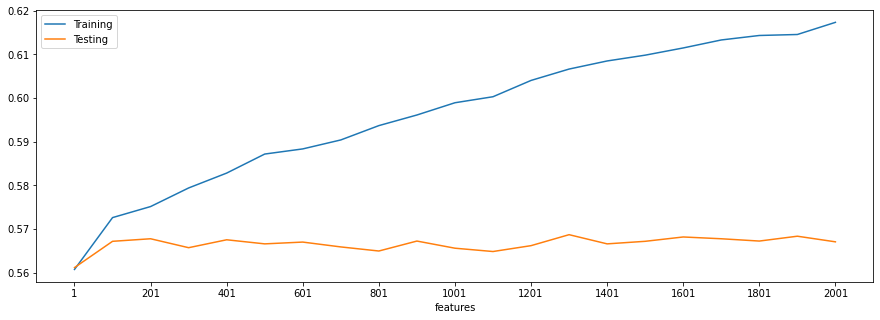

In [48]:
accuracies = pd.DataFrame(
    {
        "Training": training,
        "Testing": testing
    }
)
accuracies.index = 100*accuracies.index + 1

accuracies.plot.line(xticks=np.arange(1, 2002, 200.0), figsize=(15, 5)).set_xlabel("features")

CLearly, there is no linear boundary between the 2 classes. However, we have a lot of data and so it would be wise to create a Random Forest, as maybe it may identify properties of posts and comments that relate to property.

In [49]:
from sklearn.ensemble import RandomForestClassifier

training = []
testing = []

for i in range(1, 1000, 100):
    #training
    print(i)
    forest = RandomForestClassifier(max_depth=i).fit(X_training, y_training)
    
    training.append(forest.score(X_training, y_training))
    testing.append(forest.score(X_testing, y_testing))

1
101
201
301
401
501
601
701
801
901


In [50]:
forest = RandomForestClassifier().fit(X_training, y_training)
training.append(forest.score(X_training, y_training))
testing.append(forest.score(X_testing, y_testing))

Text(0.5, 0, 'depth of forest')

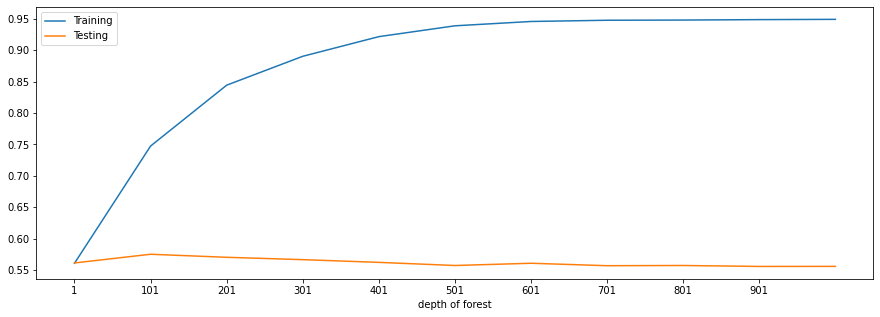

In [51]:
accuracies = pd.DataFrame(
    {
        "Training": training,
        "Testing": testing
    }
)
accuracies.index = 100*accuracies.index + 1

accuracies.plot.line(xticks=np.arange(1, 1001, 100.0), figsize=(15, 5)).set_xlabel("depth of forest")

Now we know that there is no linear boundary nor is there any distinguishable properties of popular and unpopular posts within the features, let us see whether there exists some circular relationships/groupings of the data using Naive Bayes.

In [86]:
from sklearn.naive_bayes import GaussianNB

gb = GaussianNB().fit(X_training, y_training)

print(gb.score(X_training, y_training))
print(gb.score(X_testing, y_testing))

0.5722591153990728
0.564462375021926


## Comments

We will follow the exact methods used for posts to analyse comments

In [80]:
pca = PCA(n_components=200)
commentsTransformed = pca.fit_transform(X_comments)
PCAcomments = pd.DataFrame(commentsTransformed, index=X_comments.index)
PCAcomments["label"] = comments["label"]
fig = px.scatter(PCAcomments, x=0, y=1, color="label")
fig.show()

In [81]:
X_train, X_test, y_train, y_test = train_test_split(dataComments, comments["label"], test_size=0.3, random_state=42)

In [82]:
training = []
testing = []

for i in range(1, 2002, 100):
    train_temp = X_train.copy().iloc[:,:i]
    test_temp = X_test.copy().iloc[:,:i]
    
    #training
    LR = LogisticRegression(random_state=i, max_iter=1000).fit(train_temp, y_train)
    
    training.append(LR.score(train_temp, y_train))
    testing.append(LR.score(test_temp, y_test))

Text(0.5, 0, 'features')

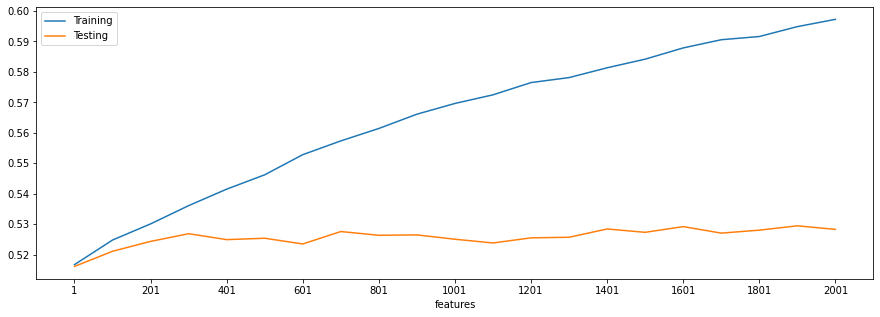

In [83]:
accuracies = pd.DataFrame(
    {
        "Training": training,
        "Testing": testing
    }
)
accuracies.index = 100*accuracies.index + 1

accuracies.plot.line(xticks=np.arange(1, 2002, 200.0), figsize=(15, 5)).set_xlabel("features")

In [84]:
training = []
testing = []

for i in range(1, 1000, 100):
    forest = RandomForestClassifier(max_depth=i).fit(X_train, y_train)
    
    training.append(forest.score(X_train, y_train))
    testing.append(forest.score(X_test, y_test))

Text(0.5, 0, 'depth of forest')

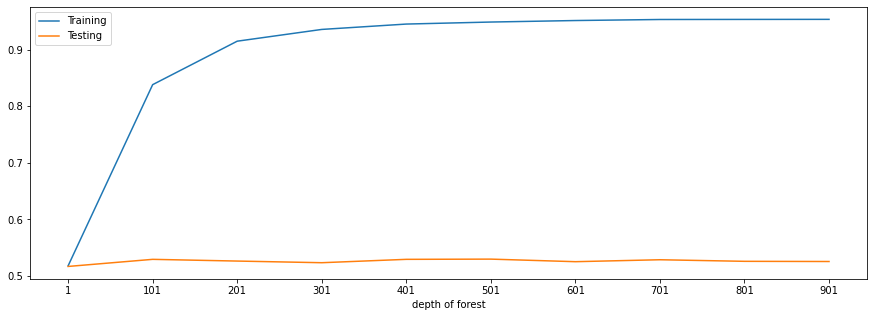

In [85]:
accuracies = pd.DataFrame(
    {
        "Training": training,
        "Testing": testing
    }
)
accuracies.index = 100*accuracies.index + 1

accuracies.plot.line(xticks=np.arange(1, 1001, 100.0), figsize=(15, 5)).set_xlabel("depth of forest")

In [87]:
gb = GaussianNB().fit(X_train, y_train)

print(gb.score(X_train, y_train))
print(gb.score(X_test, y_test))

0.5248785902594699
0.5097772597772597
